In [1]:
!nvidia-smi

Thu Sep 14 10:13:20 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.99                 Driver Version: 536.99       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   48C    P8               5W /  50W |      0MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import tensorflow as tf

In [3]:
tf.__version__

'2.9.1'

In [4]:
from helper_functions import *

In [5]:
train_dir = "101_food_classes_10_percent/train/"
test_dir = "101_food_classes_10_percent/test/"

In [6]:
walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent\test'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\apple_pie'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baby_back_ribs'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beef_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\beignets'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bibimbap'.
There are 0 directories and 250 images in '101_food_classes_10_percent\test\bread_pudding'.
There are 0 directories and 250 images in '10

In [7]:
IMG_SIZE = (224, 224)
train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode="categorical",
                                                                                image_size=IMG_SIZE)
test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE,
                                                                shuffle=False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


In [8]:
checkpoint_path = "101_classes_10_percent_data_model_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor="val_accuracy",
                                                         save_best_only=True)

In [9]:
data_augmentation = tf.keras.models.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
    tf.keras.layers.RandomHeight(0.2),
    tf.keras.layers.RandomWidth(0.2)
], name ="data_augmentation")

In [10]:
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top=False)
base_model.trainable = False

inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
outputs = tf.keras.layers.Dense(len(train_data_all_10_percent.class_names), activation="softmax", name="output_layer")(x)
model = tf.keras.Model(inputs, outputs)

In [11]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling (Glo  (None, 1280)             0         
 balAveragePooling2D)                                            
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [12]:
model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs=5,
                                           validation_data=test_data,
                                           validation_steps=int(0.15 * len(test_data)),
                                           callbacks=[checkpoint_callback])

Epoch 1/5
237/237 [==============================] - 129s 492ms/step - loss: 3.3691 - accuracy: 0.2717 - val_loss: 2.5916 - val_accuracy: 0.4134
Epoch 2/5
237/237 [==============================] - 87s 367ms/step - loss: 2.1970 - accuracy: 0.4976 - val_loss: 2.0978 - val_accuracy: 0.4942
Epoch 3/5
237/237 [==============================] - 79s 335ms/step - loss: 1.8176 - accuracy: 0.5657 - val_loss: 1.9286 - val_accuracy: 0.5201
Epoch 4/5
237/237 [==============================] - 74s 311ms/step - loss: 1.6043 - accuracy: 0.6083 - val_loss: 1.8403 - val_accuracy: 0.5283
Epoch 5/5
237/237 [==============================] - 69s 292ms/step - loss: 1.4495 - accuracy: 0.6448 - val_loss: 1.7936 - val_accuracy: 0.5342


In [13]:
results_feature_extraction_model = model.evaluate(test_data)
results_feature_extraction_model

790/790 [==============================] - 77s 98ms/step - loss: 1.5766 - accuracy: 0.5853


[1.5765892267227173, 0.5853069424629211]

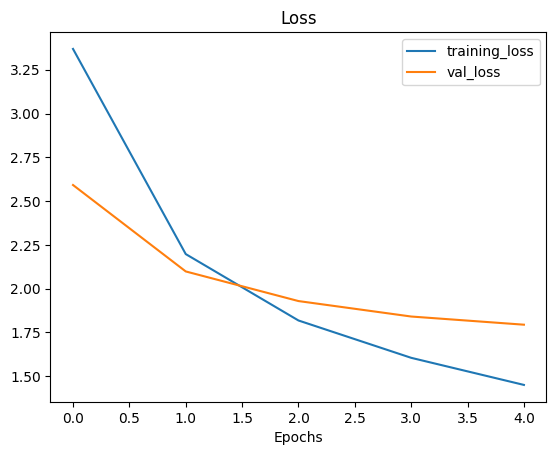

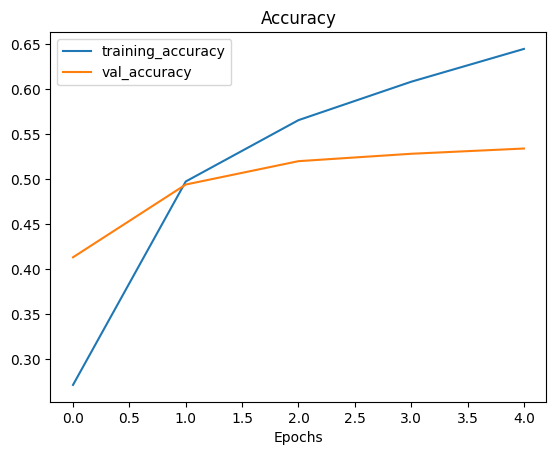

In [14]:
plot_loss_curves(history_all_classes_10_percent)

In [15]:
base_model.trainable = True

for layer in base_model.layers[:-5]:
    layer.trainable = False

In [16]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=['accuracy'])

In [17]:
for layer in model.layers:
    print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_average_pooling True
output_layer True


In [18]:
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number, layer.name, layer.trainable)

0 input_1 False
1 rescaling False
2 normalization False
3 tf.math.truediv False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze Fals

In [19]:
fine_tune_epochs = 10

history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                     epochs=fine_tune_epochs,
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15 * len(test_data)),
                                                     initial_epoch=history_all_classes_10_percent.epoch[-1])

Epoch 5/10
237/237 [==============================] - 76s 303ms/step - loss: 1.2073 - accuracy: 0.6849 - val_loss: 1.7288 - val_accuracy: 0.5503
Epoch 6/10
237/237 [==============================] - 62s 260ms/step - loss: 1.0926 - accuracy: 0.7113 - val_loss: 1.7460 - val_accuracy: 0.5482
Epoch 7/10
237/237 [==============================] - 65s 272ms/step - loss: 0.9987 - accuracy: 0.7314 - val_loss: 1.7643 - val_accuracy: 0.5482
Epoch 8/10
237/237 [==============================] - 71s 299ms/step - loss: 0.9444 - accuracy: 0.7484 - val_loss: 1.7551 - val_accuracy: 0.5445
Epoch 9/10
237/237 [==============================] - 71s 299ms/step - loss: 0.8794 - accuracy: 0.7634 - val_loss: 1.7267 - val_accuracy: 0.5540
Epoch 10/10
237/237 [==============================] - 66s 280ms/step - loss: 0.8371 - accuracy: 0.7769 - val_loss: 1.7435 - val_accuracy: 0.5482


In [20]:
results_all_classes_10_percent_fine_tune = model.evaluate(test_data)
results_all_classes_10_percent_fine_tune

790/790 [==============================] - 93s 117ms/step - loss: 1.4864 - accuracy: 0.6075


[1.4863848686218262, 0.6074851751327515]

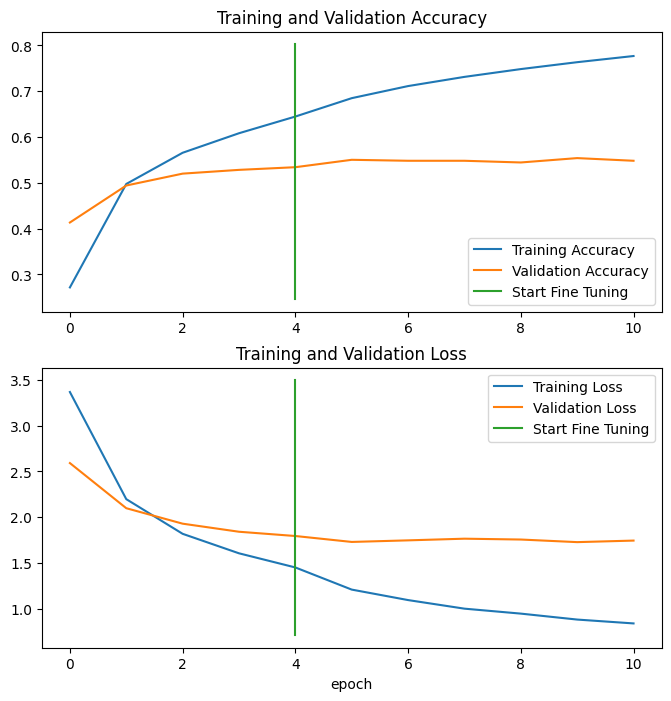

In [21]:
compare_historys(original_history=history_all_classes_10_percent,
                 new_history=history_all_classes_10_percent_fine_tune,
                 initial_epochs=5)

In [22]:
saved_model_path = "06_101_food_class_10_percent_saved_big_dog_model.zip"

In [23]:
downloaded_model = tf.keras.models.load_model(saved_model_path.split(".")[0])

In [24]:
downloaded_model_loss, downloaded_model_accuracy = downloaded_model.evaluate(test_data)
downloaded_model_loss, downloaded_model_accuracy

790/790 [==============================] - 78s 98ms/step - loss: 1.8027 - accuracy: 0.6078


(1.8027206659317017, 0.6077623963356018)

In [25]:
pred_probs = downloaded_model.predict(test_data)

790/790 [==============================] - 75s 94ms/step


In [26]:
len(test_data)

790

In [27]:
790*32

25280

In [28]:
len(pred_probs)

25250

In [29]:
pred_probs.shape

(25250, 101)

In [30]:
pred_probs[:10]

array([[5.95420413e-02, 3.57421209e-06, 4.13768031e-02, ...,
        1.41386547e-09, 8.35305982e-05, 3.08975601e-03],
       [9.64016795e-01, 1.37532197e-09, 8.47801741e-04, ...,
        5.42869966e-05, 7.83616054e-12, 9.84656467e-10],
       [9.59258795e-01, 3.25336805e-05, 1.48669071e-03, ...,
        7.18910712e-07, 5.43976341e-07, 4.02760452e-05],
       ...,
       [4.73132551e-01, 1.29312312e-07, 1.48055772e-03, ...,
        5.97500359e-04, 6.69692163e-05, 2.34693380e-05],
       [4.45718467e-02, 4.72654875e-07, 1.22585334e-01, ...,
        6.34985781e-06, 7.53185941e-06, 3.67787736e-03],
       [7.24389613e-01, 1.92498462e-09, 5.23110430e-05, ...,
        1.22913846e-03, 1.57927149e-09, 9.63958519e-05]], dtype=float32)

In [31]:
print(f"Number of prediction probabilities for sample 0: {len(pred_probs[0])}")
print(f"What prediction probability sample 0 looks like:\n {pred_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like:
 [5.9542041e-02 3.5742121e-06 4.1376803e-02 1.0660556e-09 8.1614129e-09
 8.6639824e-09 8.0927055e-07 8.5652749e-07 1.9859111e-05 8.0977691e-07
 3.1727807e-09 9.8674127e-07 2.8532257e-04 7.8049051e-10 7.4230134e-04
 3.8916383e-05 6.4740493e-06 2.4977257e-06 3.7891168e-05 2.0678330e-07
 1.5538468e-05 8.1507341e-07 2.6230571e-06 2.0010687e-07 8.3827535e-07
 5.4215934e-06 3.7390967e-06 1.3150484e-08 2.7761527e-03 2.8051811e-05
 6.8562028e-10 2.5574856e-05 1.6688929e-04 7.6406859e-10 4.0452901e-04
 1.3150634e-08 1.7957395e-06 1.4448203e-06 2.3062935e-02 8.2466863e-07
 8.5366020e-07 1.7138630e-06 7.0525170e-06 1.8402273e-08 2.8553430e-07
 7.9483771e-06 2.0681496e-06 1.8525189e-07 3.3619838e-08 3.1522568e-04
 1.0410943e-05 8.5448613e-07 8.4741873e-01 1.0555466e-05 4.4094796e-07
 3.7404185e-05 3.5306195e-05 3.2489010e-05 6.7315006e-05 1.2852544e-08
 2.6219760e-10 1.0318130e-05 8.5744046e-05 1.

In [32]:
test_data.class_names[52]

'gyoza'

In [33]:
pred_classes = pred_probs.argmax(axis=1)
pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0], dtype=int64)

In [34]:
test_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [35]:
test_data.unbatch()

<_UnbatchDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(101,), dtype=tf.float32, name=None))>

In [36]:
y_labels = []
for images, labels in test_data.unbatch():
    y_labels.append(labels.numpy().argmax())
    
y_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [37]:
len(y_labels)

25250

In [38]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [39]:
confusion_matrix(y_labels, pred_classes)

array([[ 51,   1,  25, ...,   5,   0,  16],
       [  0, 173,   0, ...,   0,   0,   0],
       [  8,   2, 162, ...,   1,   0,   3],
       ...,
       [  1,   0,   5, ...,  82,   0,   0],
       [  0,   1,   0, ...,   0,  67,   0],
       [  2,   0,   0, ...,   2,   0, 175]], dtype=int64)

In [40]:
accuracy_score(y_labels, pred_classes)

0.6077623762376237

In [41]:
np.isclose(accuracy_score(y_labels, pred_classes), downloaded_model_accuracy)

True

In [42]:
plt.figure(figsize=(100, 100))
sns.heatmap(confusion_matrix(y_labels, pred_classes))

<Axes: >

In [43]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [44]:
make_confusion_matrix(y_labels, pred_classes, test_data.class_names, figsize=(100, 100))

In [45]:
print(classification_report(y_labels, pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

In [46]:
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584903,
  'support': 250.0},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250.0},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713754,
  'support': 250.0},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250.0},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.544080604534005,
  'support': 250.0},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.41860465116279066,
  'support': 250.0},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250.0},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511386,
  'support': 250.0},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'sup

In [47]:
test_data.class_names[70]

'pad_thai'

In [48]:
classification_report_dict.items()

dict_items([('0', {'precision': 0.29310344827586204, 'recall': 0.204, 'f1-score': 0.24056603773584903, 'support': 250.0}), ('1', {'precision': 0.5088235294117647, 'recall': 0.692, 'f1-score': 0.5864406779661017, 'support': 250.0}), ('2', {'precision': 0.5625, 'recall': 0.648, 'f1-score': 0.6022304832713754, 'support': 250.0}), ('3', {'precision': 0.7415730337078652, 'recall': 0.528, 'f1-score': 0.616822429906542, 'support': 250.0}), ('4', {'precision': 0.7346938775510204, 'recall': 0.432, 'f1-score': 0.544080604534005, 'support': 250.0}), ('5', {'precision': 0.34177215189873417, 'recall': 0.54, 'f1-score': 0.41860465116279066, 'support': 250.0}), ('6', {'precision': 0.6677966101694915, 'recall': 0.788, 'f1-score': 0.7229357798165138, 'support': 250.0}), ('7', {'precision': 0.8197424892703863, 'recall': 0.764, 'f1-score': 0.7908902691511386, 'support': 250.0}), ('8', {'precision': 0.4025974025974026, 'recall': 0.372, 'f1-score': 0.3866943866943867, 'support': 250.0}), ('9', {'precision'

In [49]:
class_f1_scores = {}
for k, v in classification_report_dict.items():
    if k == "accuracy":
        break
    else:
        class_f1_scores[test_data.class_names[int(k)]] = v["f1-score"]

In [50]:
class_f1_scores

{'apple_pie': 0.24056603773584903,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713754,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.544080604534005,
 'beet_salad': 0.41860465116279066,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511386,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056106,
 'caprese_salad': 0.5775193798449612,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.36744186046511623,
 'cheese_plate': 0.5654135338345864,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.45261669024045265,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990757,
 'clam_chowder': 0.7708779443254817,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.4625550660792952,
 'creme_brulee

In [51]:
f1_scores = pd.DataFrame({'class_name': list(class_f1_scores.keys()), 
                        'f1-score': list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

In [52]:
f1_scores

,class_name,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
...,...,...
56,huevos_rancheros,0.339833
22,chocolate_mousse,0.329159
77,pork_chop,0.308756
39,foie_gras,0.297491


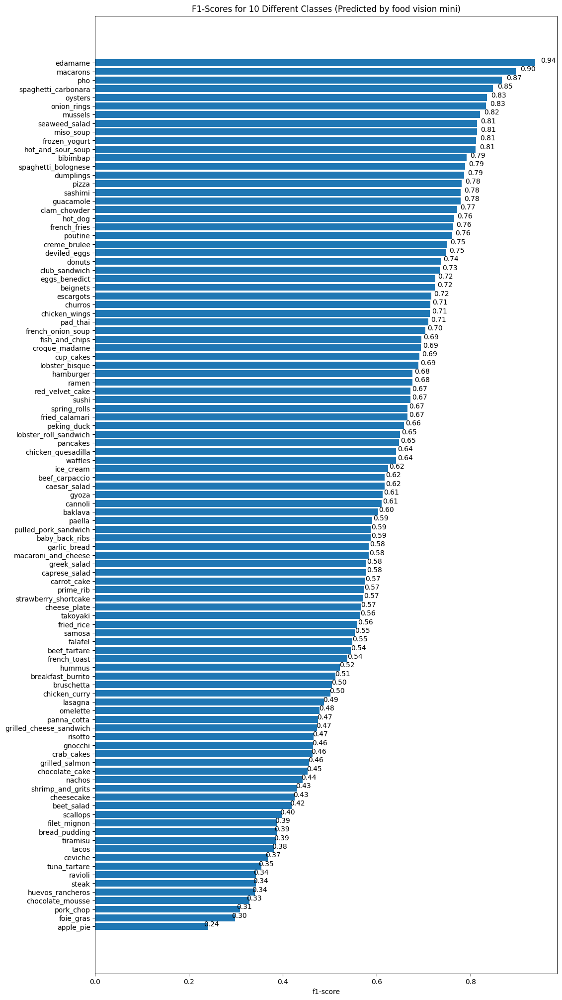

In [53]:
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(list(f1_scores["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores for 10 Different Classes (Predicted by food vision mini)")
ax.invert_yaxis()

def autolabel(rects):
  """
  Attach a text label above each bar displaying its height (it's value).
  """
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)

In [54]:
def load_and_prep_image(filename, img_shape=224, scale=True):
    img = tf.io.read_file(filename)
    img = tf.io.decode_image(img)
    img = tf.image.resize(img, [img_shape, img_shape])
    if scale:
        return img/255. 
    else:
        return img

1/1 [==============================] - 0s 55ms/step


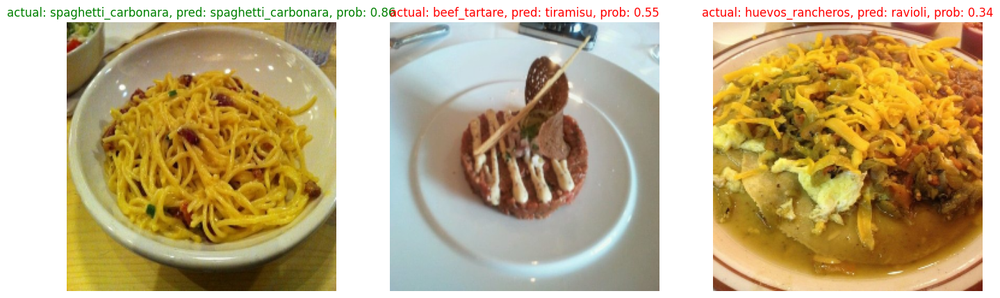

In [57]:
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
    class_name = random.choice(test_data.class_names)
    filename = random.choice(os.listdir(test_dir + "/" + class_name))
    filepath = test_dir + class_name + "/" + filename
    
    img = load_and_prep_image(filepath, scale=False)
    pred_prob = downloaded_model.predict(tf.expand_dims(img, axis=0))
    pred_class = test_data.class_names[pred_prob.argmax()]
    
    plt.subplot(1, 3, i+1)
    plt.imshow(img/255.)
    if class_name == pred_class:
        title_color = "g"
    else:
        title_color = "r"
    plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
    plt.axis(False)

In [66]:
filepaths = []
for filepath in test_data.list_files("101_food_classes_10_percent/test/*/*.jpg", shuffle=False):
    filepaths.append(filepath.numpy())
filepaths[:10]

[b'101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\110043.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1106961.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1113017.jpg']

In [60]:
import pandas as pd
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": pred_probs.max(axis=1),
                        "y_true_classname": [test_data.class_names[i] for i in y_labels],
                        "y_pred_classname": [test_data.class_names[i] for i in pred_classes]}) 
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,52,0.847419,apple_pie,gyoza
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.964017,apple_pie,apple_pie
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.959259,apple_pie,apple_pie
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,80,0.658606,apple_pie,pulled_pork_sandwich
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,79,0.367901,apple_pie,prime_rib


In [61]:
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,52,0.847419,apple_pie,gyoza,False
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.964017,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,0.959259,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,80,0.658606,apple_pie,pulled_pork_sandwich,False
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,79,0.367901,apple_pie,prime_rib,False


In [62]:
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
21810,b'101_food_classes_10_percent\\test\\scallops\...,87,29,0.999997,scallops,cup_cakes,False
231,b'101_food_classes_10_percent\\test\\apple_pie...,0,100,0.999995,apple_pie,waffles,False
15359,b'101_food_classes_10_percent\\test\\lobster_r...,61,53,0.999988,lobster_roll_sandwich,hamburger,False
23539,b'101_food_classes_10_percent\\test\\strawberr...,94,83,0.999987,strawberry_shortcake,red_velvet_cake,False
21400,b'101_food_classes_10_percent\\test\\samosa\\3...,85,92,0.999981,samosa,spring_rolls,False
24540,b'101_food_classes_10_percent\\test\\tiramisu\...,98,83,0.999947,tiramisu,red_velvet_cake,False
2511,b'101_food_classes_10_percent\\test\\bruschett...,10,61,0.999945,bruschetta,lobster_roll_sandwich,False
5574,b'101_food_classes_10_percent\\test\\chocolate...,22,21,0.999939,chocolate_mousse,chocolate_cake,False
17855,b'101_food_classes_10_percent\\test\\paella\\2...,71,65,0.999931,paella,mussels,False
23797,b'101_food_classes_10_percent\\test\\sushi\\16...,95,86,0.999904,sushi,sashimi,False


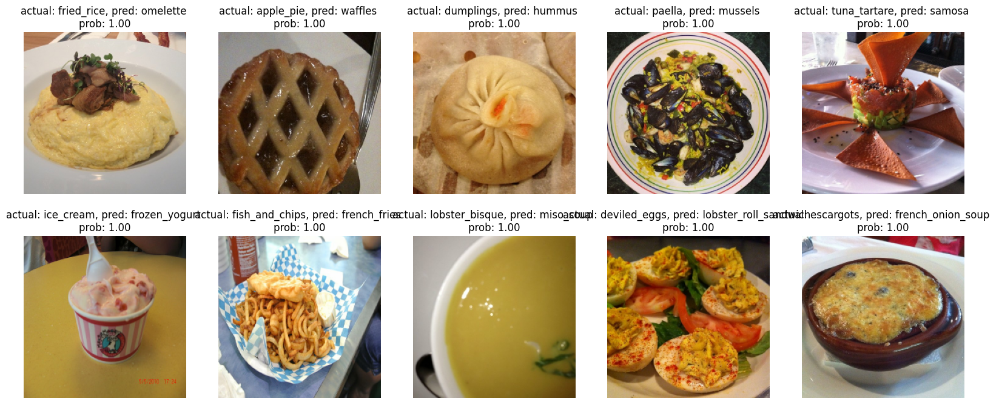

In [87]:
images_to_view = 10
start_index = 25 
plt.figure(figsize=(20, 8))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()): 
    plt.subplot(2, 5, i+1)
    img = load_and_prep_image(row[1], scale=True)
    _, _, _, _, pred_prob, y_true, y_pred, _ = row
    plt.imshow(img)
    plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
    plt.axis(False)

In [89]:
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 [==============================] - 0s 43ms/step


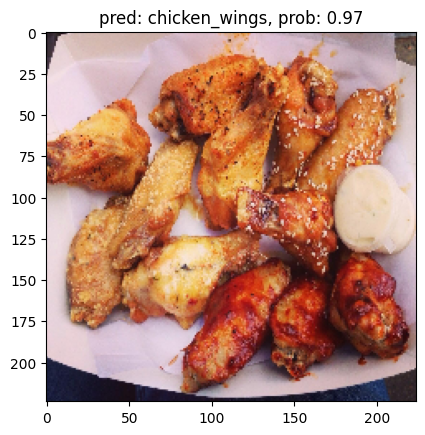

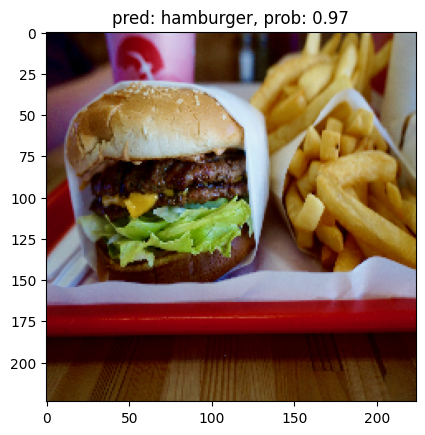

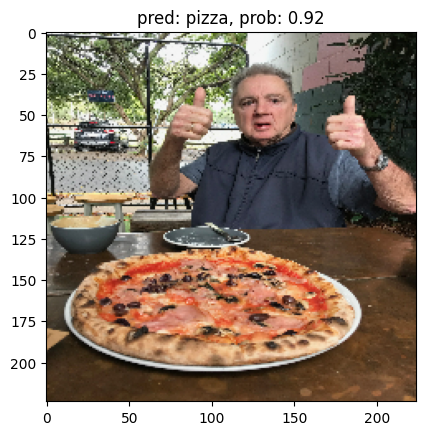

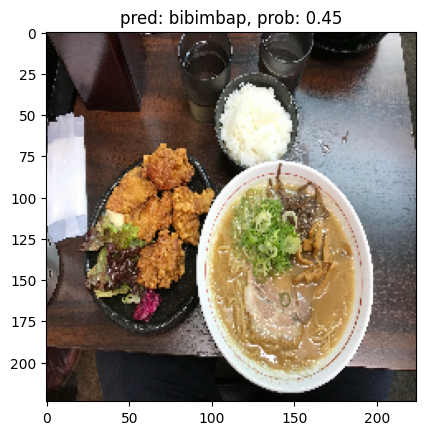

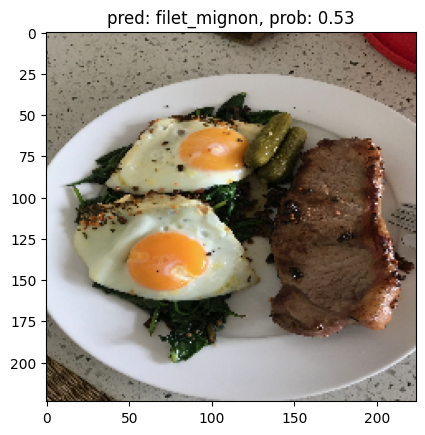

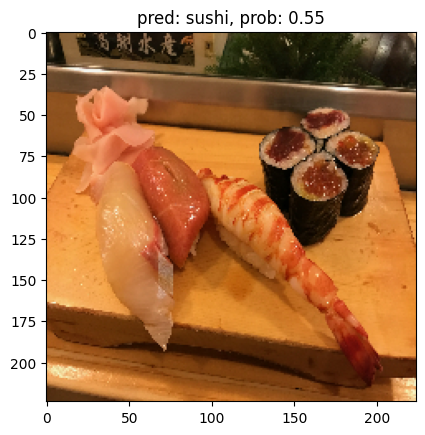

In [91]:
for img in custom_food_images:
    img = load_and_prep_image(img, scale=False)
    pred_prob = model.predict(tf.expand_dims(img, axis=0))
    pred_class = test_data.class_names[pred_prob.argmax()]
    
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f'pred: {pred_class}, prob: {pred_prob.max():.2f}')
    plt.axis()

In [100]:
def custom_images_prediction(path = "custom_food_images"):
    custom_food_images = [path + '/' + img_path for img_path in os.listdir(path)]
    for img in custom_food_images:
        img = load_and_prep_image(img, scale=False)
        pred_prob = model.predict(tf.expand_dims(img, axis=0))
        pred_class = test_data.class_names[pred_prob.argmax()]

        plt.figure()
        plt.imshow(img/255.)
        plt.title(f'pred: {pred_class}, prob: {pred_prob.max():.2f}')
        plt.axis(False)

1/1 [==============================] - 0s 44ms/step


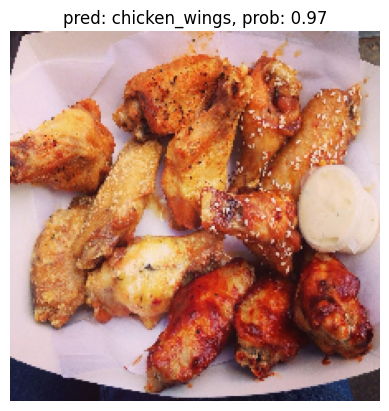

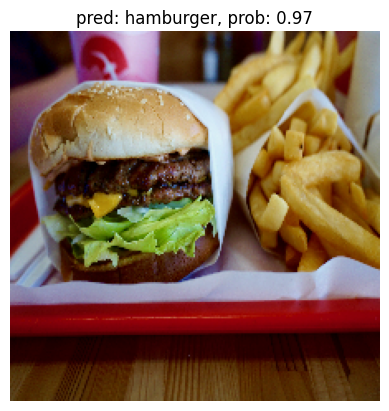

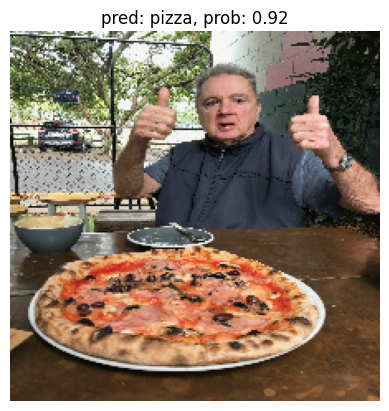

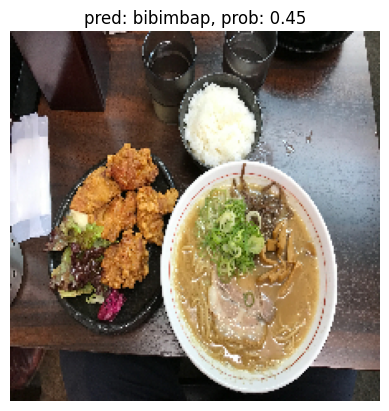

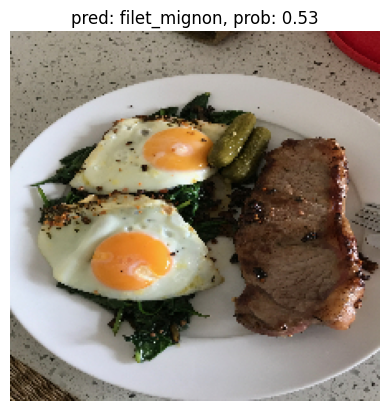

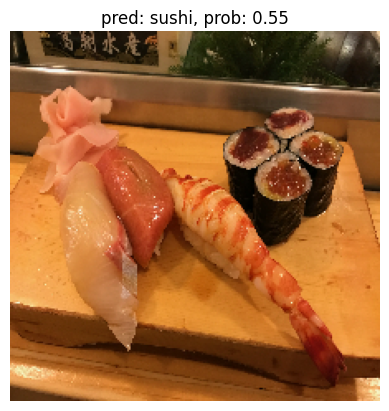

In [101]:
custom_images_prediction()

1/1 [==============================] - 0s 43ms/step


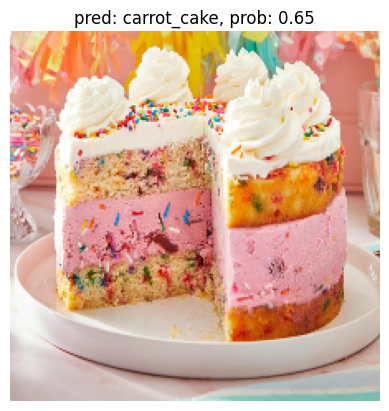

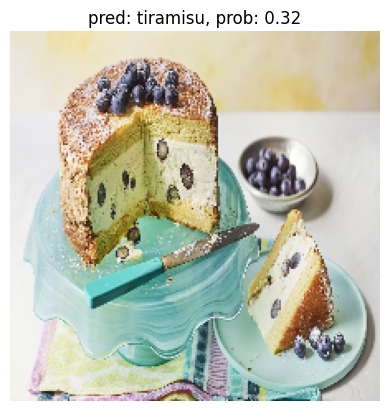

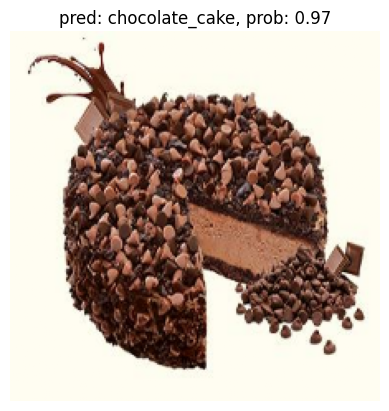

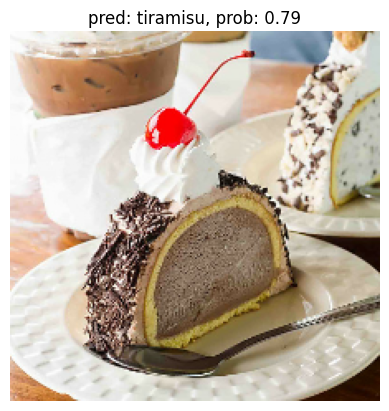

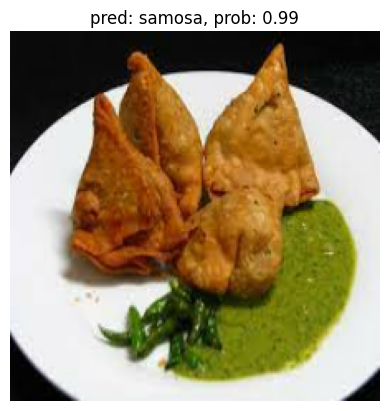

...

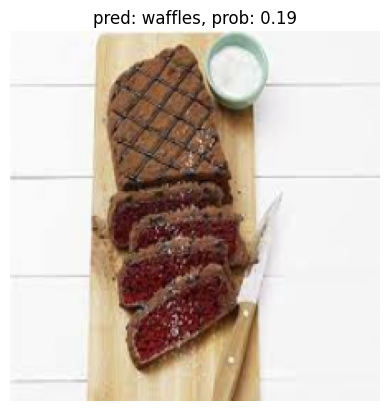

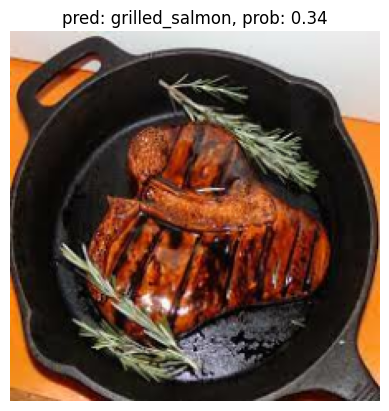

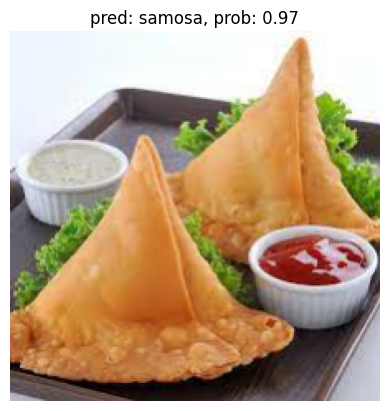

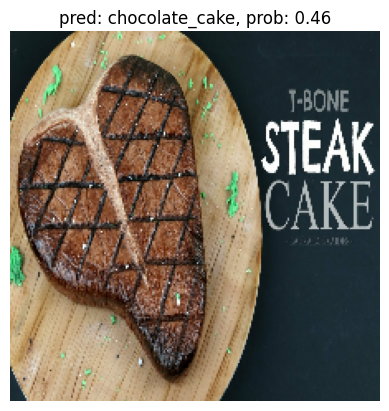

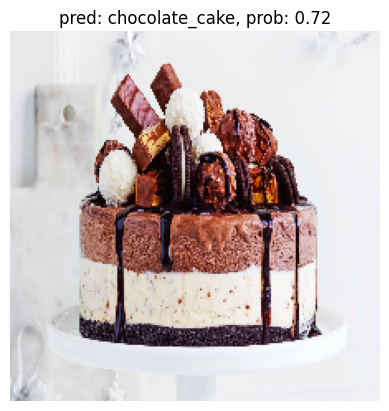

In [102]:
custom_images_prediction('My Images')